In [ ]:
pip install segmentation-models-pytorch
# Segmentation Models PyTorch is a deep learning library that provides pre-trained models for semantic segmentation tasks.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [ ]:
# Essential imports

import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album


import segmentation_models_pytorch as smp
from tqdm import tqdm


import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
base_dir = '/content/drive/MyDrive/Ulcer_dataset/'

In [ ]:
x_train_dir = base_dir + 'train/images/'
y_train_dir = base_dir + 'train/labels/'
x_valid_dir = base_dir + 'validation/images/'
y_valid_dir = base_dir + 'validation/labels/'
x_test_dir = base_dir + 'test/images/'
y_test_dir = base_dir + 'test/labels/'

In [ ]:
# Define classes
class_names = ['background', 'ulcer']
class_rgb_values = [[0, 0, 0], [255, 255, 255]]

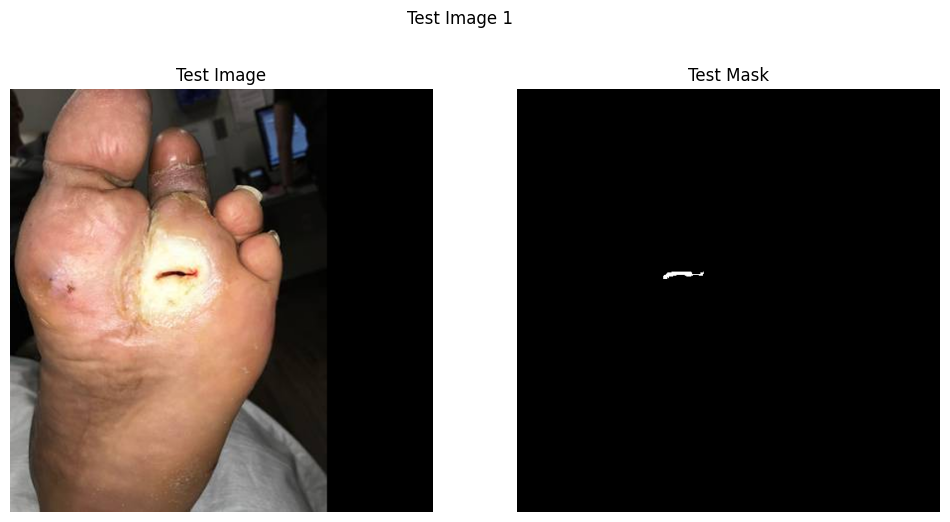

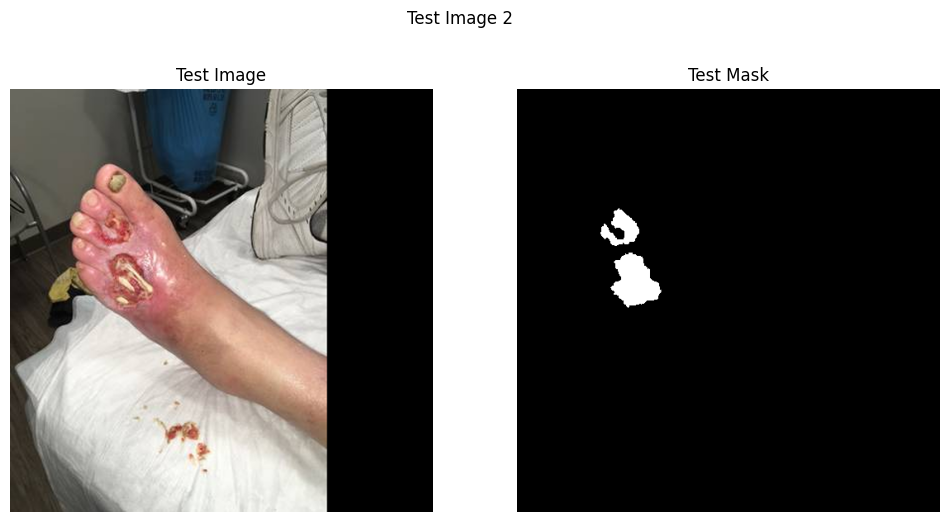

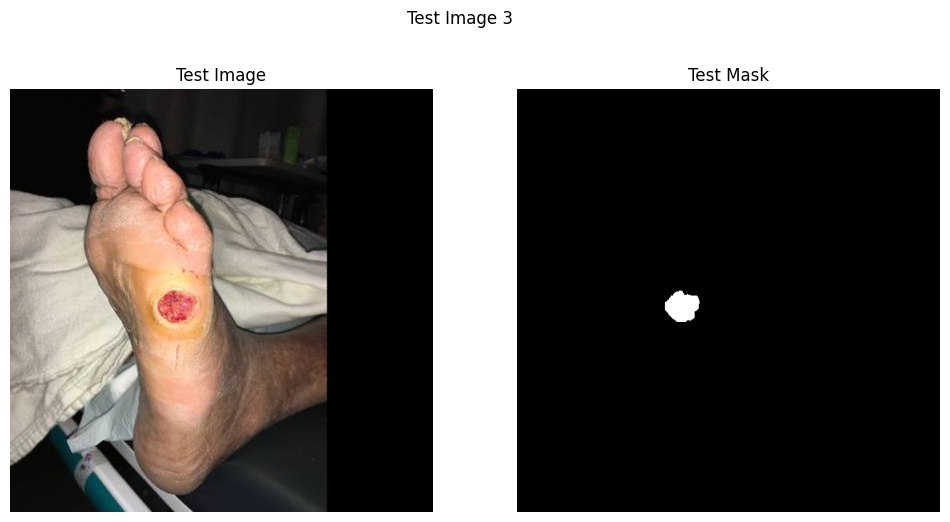

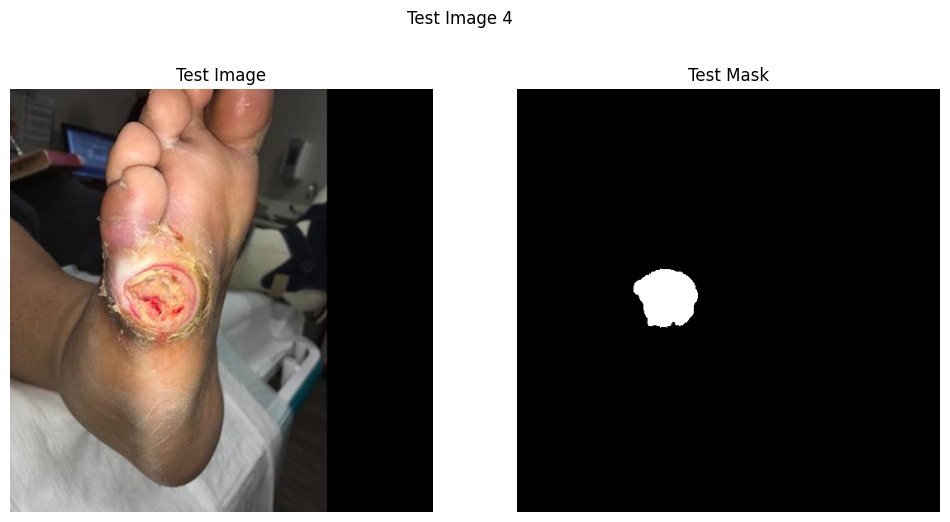

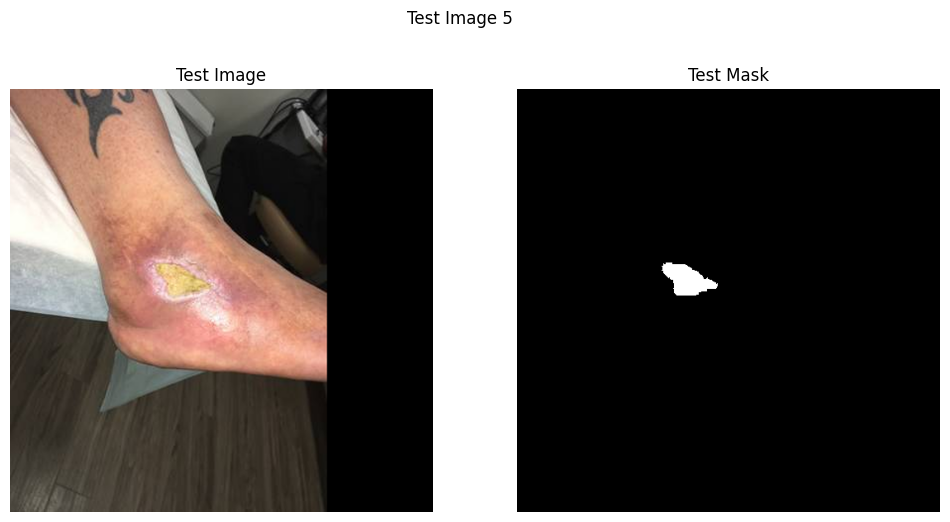

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

# Function to load an image and its corresponding mask
def load_image_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Mask is grayscale
    return image, mask

# Function to visualize an image and mask
def visualize_image_mask(image, mask, title=""):
    plt.figure(figsize=(12, 6))

    # Plot Image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
    plt.title("Test Image")
    plt.axis('off')

    # Plot Mask
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Test Mask")
    plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Load test dataset
test_images = sorted(os.listdir(x_test_dir))
test_masks = sorted(os.listdir(y_test_dir))

# Ensure images and masks are correctly paired
for i in range(5):  # Show the first 5 test images and masks
    image_name = test_images[i]
    mask_name = test_masks[i]

    image_path = os.path.join(x_test_dir, image_name)
    mask_path = os.path.join(y_test_dir, mask_name)

    image, mask = load_image_mask(image_path, mask_path)
    visualize_image_mask(image, mask, title=f"Test Image {i+1}")


Using device: cuda


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b3-5fb5a3c3.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b3-5fb5a3c3.pth
100%|██████████| 47.1M/47.1M [00:00<00:00, 285MB/s]


Epoch 1/100


Validation: 100%|██████████| 25/25 [00:39<00:00,  1.60s/it]


Train Loss: 0.4342, Train IoU: 0.1523
Valid Loss: 0.3027, Valid IoU: 0.3842
Epoch 2/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.38it/s]


Train Loss: 0.2078, Train IoU: 0.4775
Valid Loss: 0.1729, Valid IoU: 0.5725
Epoch 3/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.54it/s]


Train Loss: 0.1328, Train IoU: 0.6269
Valid Loss: 0.1141, Valid IoU: 0.6575
Epoch 4/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.65it/s]


Train Loss: 0.0980, Train IoU: 0.6598
Valid Loss: 0.0837, Valid IoU: 0.7082
Epoch 5/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.73it/s]


Train Loss: 0.0750, Train IoU: 0.7198
Valid Loss: 0.0647, Valid IoU: 0.7441
Epoch 6/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.34it/s]


Train Loss: 0.0603, Train IoU: 0.7320
Valid Loss: 0.0524, Valid IoU: 0.7410
Epoch 7/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.15it/s]


Train Loss: 0.0495, Train IoU: 0.7561
Valid Loss: 0.0440, Valid IoU: 0.7807
Epoch 8/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.26it/s]


Train Loss: 0.0409, Train IoU: 0.7779
Valid Loss: 0.0369, Valid IoU: 0.8006
Epoch 9/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.71it/s]


Train Loss: 0.0360, Train IoU: 0.7561
Valid Loss: 0.0336, Valid IoU: 0.7748
Epoch 10/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.63it/s]


Train Loss: 0.0311, Train IoU: 0.7814
Valid Loss: 0.0279, Valid IoU: 0.7902
Epoch 11/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.52it/s]


Train Loss: 0.0270, Train IoU: 0.7864
Valid Loss: 0.0247, Valid IoU: 0.7957
Epoch 12/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.19it/s]


Train Loss: 0.0240, Train IoU: 0.7890
Valid Loss: 0.0227, Valid IoU: 0.7713
Epoch 13/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.14it/s]


Train Loss: 0.0211, Train IoU: 0.8038
Valid Loss: 0.0202, Valid IoU: 0.8053
Epoch 14/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.31it/s]


Train Loss: 0.0191, Train IoU: 0.8139
Valid Loss: 0.0192, Valid IoU: 0.7799
Epoch 15/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.61it/s]


Train Loss: 0.0175, Train IoU: 0.8094
Valid Loss: 0.0168, Valid IoU: 0.8048
Epoch 16/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.62it/s]


Train Loss: 0.0158, Train IoU: 0.8262
Valid Loss: 0.0157, Valid IoU: 0.8111
Epoch 17/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.54it/s]


Train Loss: 0.0145, Train IoU: 0.8292
Valid Loss: 0.0145, Valid IoU: 0.8171
Epoch 18/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.17it/s]


Train Loss: 0.0132, Train IoU: 0.8373
Valid Loss: 0.0136, Valid IoU: 0.8203
Epoch 19/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.58it/s]


Train Loss: 0.0125, Train IoU: 0.8370
Valid Loss: 0.0134, Valid IoU: 0.8103
Epoch 20/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.64it/s]


Train Loss: 0.0121, Train IoU: 0.8323
Valid Loss: 0.0121, Valid IoU: 0.8202
Epoch 21/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.28it/s]


Train Loss: 0.0110, Train IoU: 0.8431
Valid Loss: 0.0112, Valid IoU: 0.8249
Epoch 22/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.19it/s]


Train Loss: 0.0104, Train IoU: 0.8369
Valid Loss: 0.0118, Valid IoU: 0.8103
Epoch 23/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.69it/s]


Train Loss: 0.0099, Train IoU: 0.8454
Valid Loss: 0.0110, Valid IoU: 0.8183
Epoch 24/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.53it/s]


Train Loss: 0.0093, Train IoU: 0.8503
Valid Loss: 0.0104, Valid IoU: 0.8178
Epoch 25/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.21it/s]


Train Loss: 0.0086, Train IoU: 0.8531
Valid Loss: 0.0101, Valid IoU: 0.8179
Epoch 26/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.45it/s]


Train Loss: 0.0085, Train IoU: 0.8523
Valid Loss: 0.0093, Valid IoU: 0.8308
Epoch 27/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.61it/s]


Train Loss: 0.0082, Train IoU: 0.8537
Valid Loss: 0.0092, Valid IoU: 0.8270
Epoch 28/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.20it/s]


Train Loss: 0.0076, Train IoU: 0.8612
Valid Loss: 0.0093, Valid IoU: 0.8243
Epoch 29/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.22it/s]


Train Loss: 0.0075, Train IoU: 0.8571
Valid Loss: 0.0086, Valid IoU: 0.8257
Epoch 30/100


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.69it/s]


Train Loss: 0.0072, Train IoU: 0.8582
Valid Loss: 0.0096, Valid IoU: 0.8089
Epoch 31/100


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.50it/s]


Train Loss: 0.0069, Train IoU: 0.8570
Valid Loss: 0.0089, Valid IoU: 0.8171
Early stopping triggered at epoch 31
Starting fine-tuning with a lower learning rate
Fine-tuning Epoch 1/10


Validation: 100%|██████████| 25/25 [00:08<00:00,  3.12it/s]


Train Loss: 0.0077, Train IoU: 0.8654
Valid Loss: 0.0092, Valid IoU: 0.8316
Saved improved model with IoU: 0.8316
Fine-tuning Epoch 2/10


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.73it/s]


Train Loss: 0.0077, Train IoU: 0.8657
Valid Loss: 0.0089, Valid IoU: 0.8308
Fine-tuning Epoch 3/10


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.61it/s]


Train Loss: 0.0073, Train IoU: 0.8637
Valid Loss: 0.0089, Valid IoU: 0.8280
Fine-tuning Epoch 4/10


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.18it/s]


Train Loss: 0.0070, Train IoU: 0.8672
Valid Loss: 0.0087, Valid IoU: 0.8280
Fine-tuning Epoch 5/10


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.62it/s]


Train Loss: 0.0068, Train IoU: 0.8685
Valid Loss: 0.0085, Valid IoU: 0.8308
Fine-tuning Epoch 6/10


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.55it/s]


Train Loss: 0.0068, Train IoU: 0.8627
Valid Loss: 0.0084, Valid IoU: 0.8302
Fine-tuning Epoch 7/10


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.21it/s]


Train Loss: 0.0066, Train IoU: 0.8671
Valid Loss: 0.0083, Valid IoU: 0.8299
Fine-tuning Epoch 8/10


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.41it/s]


Train Loss: 0.0065, Train IoU: 0.8694
Valid Loss: 0.0082, Valid IoU: 0.8285
Fine-tuning Epoch 9/10


Validation: 100%|██████████| 25/25 [00:06<00:00,  3.63it/s]


Train Loss: 0.0063, Train IoU: 0.8645
Valid Loss: 0.0082, Valid IoU: 0.8289
Fine-tuning Epoch 10/10


Validation: 100%|██████████| 25/25 [00:07<00:00,  3.35it/s]


Train Loss: 0.0061, Train IoU: 0.8702
Valid Loss: 0.0080, Valid IoU: 0.8300


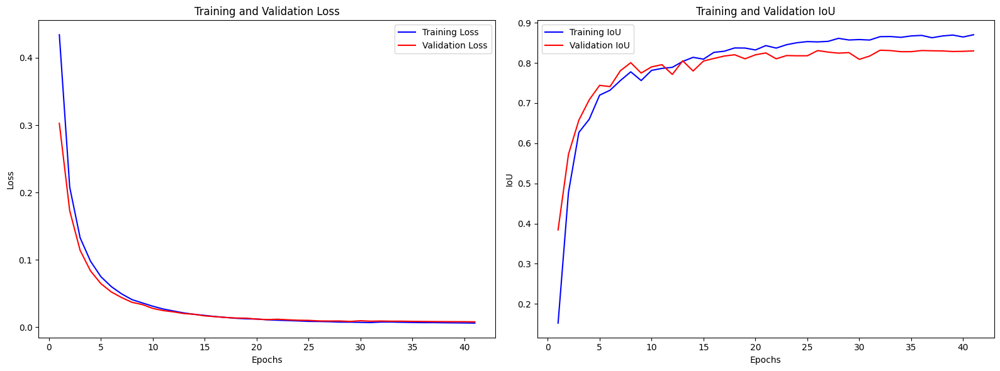

In [ ]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import albumentations as album
import segmentation_models_pytorch as smp
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

# Define directories
base_dir = '/content/drive/MyDrive/Ulcer_dataset/'
x_train_dir = os.path.join(base_dir, 'train/images/')
y_train_dir = os.path.join(base_dir, 'train/labels/')
x_valid_dir = os.path.join(base_dir, 'validation/images/')
y_valid_dir = os.path.join(base_dir, 'validation/labels/')
x_test_dir = os.path.join(base_dir, 'test/images/')
y_test_dir = os.path.join(base_dir, 'test/labels/')

# Check if directories exist
for dir_path in [x_train_dir, y_train_dir, x_valid_dir, y_valid_dir, x_test_dir, y_test_dir]:
    if not os.path.exists(dir_path):
        raise FileNotFoundError(f"Directory not found: {dir_path}")

# Define classes
class_names = ['background', 'ulcer']
class_rgb_values = [[0, 0, 0], [255, 255, 255]]

# Define transformations for data augmentation
def get_training_augmentation():
    train_transform = [
        album.HorizontalFlip(p=0.5),
        album.VerticalFlip(p=0.5),
        album.RandomRotate90(p=0.5),
        album.RandomBrightnessContrast(p=0.2),
        album.GaussianBlur(p=0.2),
        album.ShiftScaleRotate(scale_limit=0.2, rotate_limit=30, shift_limit=0.1, p=0.5, border_mode=0),
        album.OneOf(
            [
                album.CLAHE(p=1),
                album.RandomGamma(p=1),
                album.Sharpen(p=1),
            ],
            p=0.3,
        ),
    ]
    return album.Compose(train_transform)

# Define preprocessing
def get_preprocessing(preprocessing_fn):
    _transform = [
        album.Lambda(image=preprocessing_fn),
        album.Lambda(image=lambda x, **kwargs: x.astype('float32')),
        album.Lambda(mask=lambda x, **kwargs: x / 255.0),  # normalize mask to 0-1 range
    ]
    return album.Compose(_transform)

# Define dataset class
class UlcerDataset(Dataset):
    def __init__(self, images_dir, masks_dir, augmentation=None, preprocessing=None):
        self.ids = sorted(os.listdir(images_dir))
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]

        # Check if datasets are empty
        if len(self.ids) == 0:
            raise ValueError(f"No images found in {images_dir}")

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):
        # Read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], cv2.IMREAD_GRAYSCALE)

        # Check if images and masks are loaded correctly
        if image is None or mask is None:
            raise ValueError(f"Failed to load image or mask at index {i}")

        # Apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # Apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # Convert to tensor
        image = torch.from_numpy(image).permute(2, 0, 1).float()
        mask = torch.from_numpy(mask).unsqueeze(0).float()

        return image, mask

    def __len__(self):
        return len(self.ids)

# Define IoU metric
class IoU:
    def __init__(self, threshold=0.5):
        self.threshold = threshold

    def __call__(self, prediction, target):
        binary_prediction = (prediction > self.threshold).float()
        intersection = torch.sum(binary_prediction * target)
        union = torch.sum(binary_prediction) + torch.sum(target) - intersection
        return intersection / union if union != 0 else torch.tensor(1.0)

# Define model
def get_model():
    model = smp.Unet(
        encoder_name='efficientnet-b3',  # Changed from b0 to b3
        encoder_weights='imagenet',
        classes=1,
        activation='sigmoid',
    )
    return model

# Training function with early stopping and fine-tuning
def train_model(model, train_loader, valid_loader, optimizer, criterion, device, epochs=50, patience=5):
    best_iou = 0.0
    epochs_no_improve = 0
    history = {'train_loss': [], 'train_iou': [], 'valid_loss': [], 'valid_iou': []}

    for epoch in range(epochs):
        print(f'Epoch {epoch+1}/{epochs}')

        # Training phase
        model.train()
        train_loss, train_iou, train_samples = 0, 0, 0
        for images, masks in tqdm(train_loader, desc="Training"):
            images, masks = images.to(device), masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Compute metrics
            train_loss += loss.item() * images.size(0)
            train_iou += IoU()(outputs, masks).item() * images.size(0)
            train_samples += images.size(0)

        train_loss /= train_samples
        train_iou /= train_samples

        # Validation phase
        model.eval()
        valid_loss, valid_iou, valid_samples = 0, 0, 0
        with torch.no_grad():
            for images, masks in tqdm(valid_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)

                valid_loss += loss.item() * images.size(0)
                valid_iou += IoU()(outputs, masks).item() * images.size(0)
                valid_samples += images.size(0)

        valid_loss /= valid_samples
        valid_iou /= valid_samples

        # Store history
        history['train_loss'].append(train_loss)
        history['train_iou'].append(train_iou)
        history['valid_loss'].append(valid_loss)
        history['valid_iou'].append(valid_iou)

        print(f'Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}')
        print(f'Valid Loss: {valid_loss:.4f}, Valid IoU: {valid_iou:.4f}')

        # Early stopping
        if valid_iou > best_iou:
            best_iou = valid_iou
            torch.save(model.state_dict(), 'best_model.pth')
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == patience:
                print(f'Early stopping triggered at epoch {epoch+1}')
                # Load the best model before fine-tuning
                model.load_state_dict(torch.load('best_model.pth'))
                print('Starting fine-tuning with a lower learning rate')
                return fine_tune_model(model, train_loader, valid_loader, criterion, device, history)

    return history

# Fine-tuning function
def fine_tune_model(model, train_loader, valid_loader, criterion, device, history, fine_tune_epochs=10):
    # Create a new optimizer with a lower learning rate for fine-tuning
    fine_tune_optimizer = torch.optim.AdamW(model.parameters(), lr=0.00001, weight_decay=1e-6)

    best_iou = max(history['valid_iou'])

    for epoch in range(fine_tune_epochs):
        print(f'Fine-tuning Epoch {epoch+1}/{fine_tune_epochs}')

        # Training phase
        model.train()
        train_loss, train_iou, train_samples = 0, 0, 0
        for images, masks in tqdm(train_loader, desc="Fine-tuning"):
            images, masks = images.to(device), masks.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Backward pass and optimize
            fine_tune_optimizer.zero_grad()
            loss.backward()
            fine_tune_optimizer.step()

            # Compute metrics
            train_loss += loss.item() * images.size(0)
            train_iou += IoU()(outputs, masks).item() * images.size(0)
            train_samples += images.size(0)

        train_loss /= train_samples
        train_iou /= train_samples

        # Validation phase
        model.eval()
        valid_loss, valid_iou, valid_samples = 0, 0, 0
        with torch.no_grad():
            for images, masks in tqdm(valid_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)

                valid_loss += loss.item() * images.size(0)
                valid_iou += IoU()(outputs, masks).item() * images.size(0)
                valid_samples += images.size(0)

        valid_loss /= valid_samples
        valid_iou /= valid_samples

        # Store history
        history['train_loss'].append(train_loss)
        history['train_iou'].append(train_iou)
        history['valid_loss'].append(valid_loss)
        history['valid_iou'].append(valid_iou)

        print(f'Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}')
        print(f'Valid Loss: {valid_loss:.4f}, Valid IoU: {valid_iou:.4f}')

        # Save the model if it's better
        if valid_iou > best_iou:
            best_iou = valid_iou
            torch.save(model.state_dict(), 'best_fine_tuned_model.pth')
            print(f'Saved improved model with IoU: {valid_iou:.4f}')

    # Load the best fine-tuned model
    model.load_state_dict(torch.load('best_fine_tuned_model.pth'))
    return history

# Plot training history
def plot_training_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(16, 6))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], 'b-', label='Training Loss')
    plt.plot(epochs, history['valid_loss'], 'r-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot IoU
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_iou'], 'b-', label='Training IoU')
    plt.plot(epochs, history['valid_iou'], 'r-', label='Validation IoU')
    plt.title('Training and Validation IoU')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    plt.tight_layout()
    plt.savefig('training_history.png')
    plt.show()

# Main function
def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f'Using device: {device}')

    # Create datasets and dataloaders
    preprocessing_fn = smp.encoders.get_preprocessing_fn('efficientnet-b3', 'imagenet')  # Changed from b0 to b3
    train_dataset = UlcerDataset(x_train_dir, y_train_dir, augmentation=get_training_augmentation(), preprocessing=get_preprocessing(preprocessing_fn))
    valid_dataset = UlcerDataset(x_valid_dir, y_valid_dir, preprocessing=get_preprocessing(preprocessing_fn))
    test_dataset = UlcerDataset(x_test_dir, y_test_dir, preprocessing=get_preprocessing(preprocessing_fn))

    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
    valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=4)

    # Initialize model, optimizer, and loss function
    model = get_model().to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-5)
    criterion = nn.BCELoss()

    # Train the model
    history = train_model(model, train_loader, valid_loader, optimizer, criterion, device, epochs=100)

    # Plot training history
    plot_training_history(history)

if __name__ == '__main__':
    main()

Using device: cuda
Loaded best model weights.
Visualizing predictions for 50 random test images...


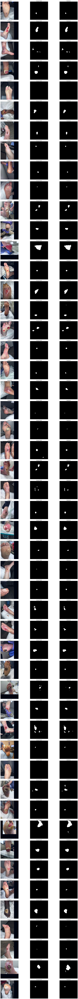

Evaluating IoU on the entire test dataset...


Evaluating Test Dataset: 100%|██████████| 14/14 [00:09<00:00,  1.47it/s]


Test IoU: 0.7713 ± 0.2022
Mean Test IoU: 0.7713
Standard Deviation of Test IoU: 0.2022


In [ ]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm

# Define IoU metric
class IoU:
    def __init__(self, threshold=0.5):
        self.threshold = threshold

    def __call__(self, prediction, target):
        binary_prediction = (prediction > self.threshold).float()
        intersection = torch.sum(binary_prediction * target)
        union = torch.sum(binary_prediction) + torch.sum(target) - intersection
        return intersection / union if union != 0 else torch.tensor(1.0)

# Function to visualize predictions
def visualize_predictions(model, test_dataset, device, num_samples=50):
    # Randomly select indices for visualization
    indices = np.random.choice(len(test_dataset), num_samples, replace=False)

    model.eval()

    plt.figure(figsize=(20, 4 * num_samples))

    for i, idx in enumerate(indices):
        image, mask = test_dataset[idx]

        # Convert to batch format
        image_batch = image.unsqueeze(0).to(device)

        # Get prediction
        with torch.no_grad():
            pred = model(image_batch)
            pred = pred.squeeze().cpu().numpy()
            pred_mask = (pred > 0.5).astype(np.uint8)

        # Convert tensors to numpy for visualization
        image = image.permute(1, 2, 0).cpu().numpy()
        mask = mask.squeeze().cpu().numpy()

        # Normalize image for display
        image = (image - image.min()) / (image.max() - image.min())

        # Display
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(image)
        plt.title(f'Image {idx}')
        plt.axis('off')

        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f'Ground Truth')
        plt.axis('off')

        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(pred_mask, cmap='gray')
        plt.title(f'Prediction')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('test_predictions_50_images.png')
    plt.show()

# Function to evaluate IoU on the entire test dataset
def evaluate_test_dataset(model, test_loader, device):
    model.eval()
    iou_fn = IoU(threshold=0.5)

    test_iou = 0
    test_samples = 0

    all_ious = []

    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Evaluating Test Dataset"):
            images, masks = images.to(device), masks.to(device)

            # Forward pass
            outputs = model(images)

            # Compute IoU for each sample
            for i in range(images.size(0)):
                sample_iou = iou_fn(outputs[i], masks[i]).item()
                all_ious.append(sample_iou)
                test_iou += sample_iou

            test_samples += images.size(0)

    mean_iou = test_iou / test_samples
    std_iou = np.std(all_ious)

    print(f'Test IoU: {mean_iou:.4f} ± {std_iou:.4f}')

    return mean_iou, all_ious

# Main function for visualization and evaluation
def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f'Using device: {device}')

    # Load the best model
    model = get_model().to(device)
    model.load_state_dict(torch.load('best_model.pth'))
    print("Loaded best model weights.")

    # Create test dataset and dataloader
    preprocessing_fn = smp.encoders.get_preprocessing_fn('efficientnet-b0', 'imagenet')
    test_dataset = UlcerDataset(x_test_dir, y_test_dir, preprocessing=get_preprocessing(preprocessing_fn))
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=4)

    # Visualize predictions for 50 random images
    print("Visualizing predictions for 50 random test images...")
    visualize_predictions(model, test_dataset, device, num_samples=50)

    # Evaluate IoU on the entire test dataset
    print("Evaluating IoU on the entire test dataset...")
    mean_iou, all_ious = evaluate_test_dataset(model, test_loader, device)

    # Print summary
    print(f'Mean Test IoU: {mean_iou:.4f}')
    print(f'Standard Deviation of Test IoU: {np.std(all_ious):.4f}')

if __name__ == '__main__':
    main()

In [ ]:
# Add this at the end of your main() function to save the model to Google Drive
# def save_model_to_drive(model, drive_path='/content/drive/MyDrive/'):
#     # Create directory if it doesn't exist
    os.makedirs(drive_path, exist_ok=True)

    # Save the model state dictionary
    model_path = os.path.join(drive_path, 'ulcer_model.pth')
    torch.save(model.state_dict(), model_path)

    # Also save the best model if it exists
    if os.path.exists('best_model.pth'):
        best_model_path = os.path.join(drive_path, 'best_ulcer_model.pth')
        import shutil
        shutil.copy('best_model.pth', best_model_path)

    # Also save the fine-tuned model if it exists
    if os.path.exists('best_fine_tuned_model.pth'):
        fine_tuned_model_path = os.path.join(drive_path, 'best_fine_tuned_ulcer_model.pth')
        import shutil
        shutil.copy('best_fine_tuned_model.pth', fine_tuned_model_path)

    print(f"Models saved to Google Drive at {drive_path}")

# Add this line at the very end of your main() function
save_model_to_drive(model)

Models saved to Google Drive at /content/drive/MyDrive/


Upload an image to predict ulcer segmentation:


Saving images.jpg to images (2).jpg
Using device: cuda
Model loaded successfully from /content/drive/MyDrive/best_fine_tuned_ulcer_model.pth
Processing images (2).jpg...


<ipython-input-6-43ed44854d58>:41: UserWarning: Using lambda is incompatible with multiprocessing. Consider using regular functions or partial().
  album.Lambda(image=lambda x, **kwargs: x.astype('float32')),


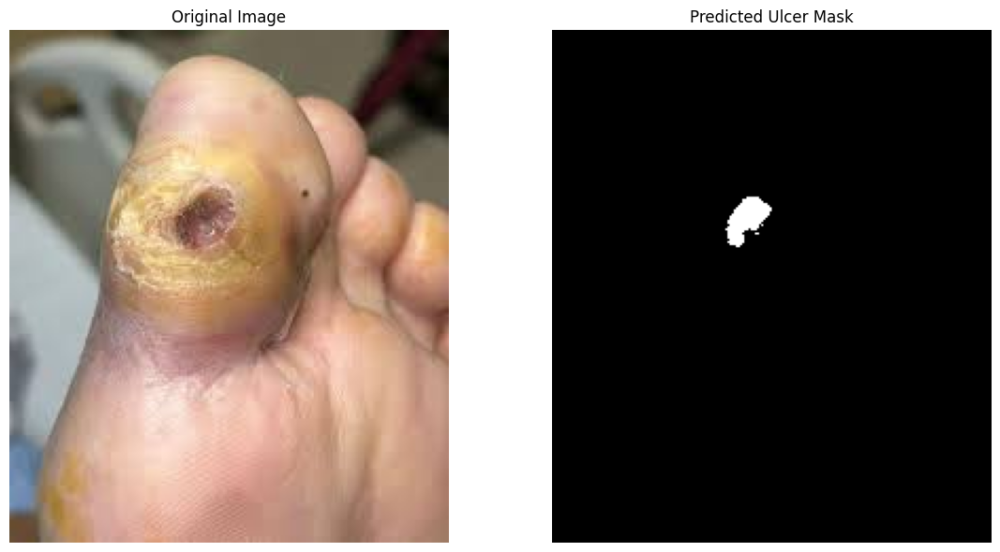

Saved mask to images (2)_mask.png


In [ ]:
import os
import cv2
import numpy as np
import torch
import segmentation_models_pytorch as smp
import albumentations as album
import matplotlib.pyplot as plt
from google.colab import files

# Load the saved model
def load_model(model_path='/content/drive/MyDrive/best_fine_tuned_ulcer_model.pth'):
    # If this path doesn't work, try the other model paths
    if not os.path.exists(model_path):
        model_path = '/content/drive/MyDrive/best_ulcer_model.pth'
    if not os.path.exists(model_path):
        model_path = '/content/drive/MyDrive/ulcer_model.pth'

    # Create model with same architecture as in your training code
    model = smp.Unet(
        encoder_name='efficientnet-b3',
        encoder_weights='imagenet',
        classes=1,
        activation='sigmoid',
    )

    # Load saved weights
    model.load_state_dict(torch.load(model_path))
    model.eval()  # Set to evaluation mode

    print(f"Model loaded successfully from {model_path}")
    return model

# Get the same preprocessing function used during training
def get_preprocessing_for_prediction():
    # Get preprocessing function for the encoder
    preprocessing_fn = smp.encoders.get_preprocessing_fn('efficientnet-b3', 'imagenet')

    # Create preprocessing transform (same as in your training code but without mask preprocessing)
    _transform = [
        album.Lambda(image=preprocessing_fn),
        album.Lambda(image=lambda x, **kwargs: x.astype('float32')),
    ]
    return album.Compose(_transform)

# Predict on a single image
def predict_image(model, image_path, device):
    # Read image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error reading image at {image_path}")
        return None, None

    # Convert to RGB (same as in training)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    original_image = image.copy()

    # Get preprocessing transform
    preprocessing = get_preprocessing_for_prediction()

    # Preprocess the image
    sample = preprocessing(image=image)
    image = sample['image']

    # Convert to tensor
    x = torch.from_numpy(image).permute(2, 0, 1).float().unsqueeze(0)
    x = x.to(device)

    # Make prediction
    with torch.no_grad():
        prediction = model(x)
        prediction = prediction.squeeze().cpu().numpy()

    # Create binary mask
    mask = (prediction > 0.5).astype(np.uint8)

    return original_image, mask

# Function to upload and predict
def upload_and_predict():
    # Upload image
    print("Upload an image to predict ulcer segmentation:")
    uploaded = files.upload()

    # Get device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Load model
    model = load_model()
    model = model.to(device)

    # Process each uploaded file
    for filename in uploaded.keys():
        print(f"Processing {filename}...")

        # Make prediction
        original_image, mask = predict_image(model, filename, device)

        if original_image is not None and mask is not None:
            # Visualize results
            plt.figure(figsize=(12, 6))

            plt.subplot(1, 2, 1)
            plt.imshow(original_image)
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(mask, cmap='gray')
            plt.title('Predicted Ulcer Mask')
            plt.axis('off')

            plt.tight_layout()
            plt.show()

            # Save mask
            mask_path = f"{os.path.splitext(filename)[0]}_mask.png"
            cv2.imwrite(mask_path, mask * 255)
            print(f"Saved mask to {mask_path}")

# Run prediction
upload_and_predict()